# Интерактивная карта фрактального множества

### Условие задачи

**Дано:**

Варианты фрактальных множеств:

- [фрактал Ляпунова](https://ru.wikipedia.org/wiki/Фрактал_Ляпунова)
  1. AB
  2. BBBBBBAAAAAA
  3. AABAB
  4. ABBBCA

- [множество Жюлиа](https://ru.wikipedia.org/wiki/Множество_Жюлиа)
  5. $z_{n+1} = z^3_n + c$
  6. $z_{n+1} = z^4_n + c$
  7. $z_{n+1} = z^3_n + z^2_n + c$
  8. $z_{n+1} = z^4_n + z^3_n + c$

- [бассейны Ньютона](https://ru.wikipedia.org/wiki/Бассейны_Ньютона)
  9. $p(z) = z^3 - 1$
  10. $p(z) = z^8 + 15z^4 - 16$
  11. $p(z) = z^3 - 2z + 2$
  12. $p(z) = sin(z)$


Обозначим за $\lambda$:
 - количество итераций (множество Жюлиа),
 - количество итераций для достижения заданной погрешности достижения корня (бассейны Ньютона)
 - экспонента Ляпунова (фрактал Ляпунова)

**Требуется**

 - реализовать функции и откомпилировать их при помощи модуля `Numba`:
     - расчет $\lambda$ для точки на комплексной плоскости
     - расчет $\lambda$ на регулярной решетке на комплексной плоскости (эта функция должна быть распараллелена при помощи `prange`)

 - создать интерактивную карту при помощи класса `DynamicMap` модуля `holoviews`:
     - цветом отобразить значение $\lambda$
     - выбрать цветовую карту [colormap](https://matplotlib.org/stable/tutorials/colors/colormaps.html)
     - размеры карты - не менее 600 х 600 точек
     - отрегулировать количество итераций так, чтобы время вычисления одного обновления карты было менее 1 секунды

 - сохранить 5 различных изображений:
     - найти красивые места на карте, применив переносы и масштабирования
     - воспользоваться кнопкой сохранения на интерактивной карте

 - добавить описание:
     - к каждой константе (комментарий)
     - к каждой функции (`docstring`)

**Правила оценивания:**

- оценка за корректно реализованные функции и созданную интерактивную карту `100` баллов

- штрафы $p(i)$, баллов:
    - не работает интерактивная карта - 50
    - ошибки в реализации функций - 20
    - не выполнена компиляция и распараллеливание - 20
    - отсутствует 5 изображений - 20
    - отсутствует `docstring` - 20
    - менее значимые недоработки - 10
    - другие ошибки штрафуются индивидуально в зависимости от их тяжести

- итоговая оценка за задание = $100 - \sum_{i}{p(i)}$

In [2]:
import numpy as np
from numba import njit, prange
from matplotlib import pyplot as plt
import matplotlib
import time

In [3]:
# Initial conditions

amin, amax = 2, 4                 # min and max values for A coefficient
bmin, bmax = 2, 4                 # min and max values for B coefficient
x_init = 0.51                     # initial point for lambda calculations

na, nb = 100, 100                 # proto task size 
na_full, nb_full = 1000, 1000     # full task size


def calc_full_time(t, na, nb, na_full, nb_full):
    """
    Calculate oriented time of full-task execution.
    
    Parameters:
    ----------------
    t: float  
       Time of proto-task execution in seconds.
       
    na: int
        Number of A coefficients in proto-task.
    
    nb: int
        Number of A coefficients in proto-task.
    
    na_full: int
             Number of A coefficients in full-task.
    
    nb_full: int
             Number of B coefficients in full-task.
    
    Returns:
    ----------------
    float
    Oriented time of full-task execution in seconds.
    
    """
    return t * (na_full + 1) * (nb_full + 1) / (na + 1) / (nb + 1)

In [4]:
@njit
def get_coef(a: float, b: float, seq: np.array, n: int):
    """
    Get coefficient number (n) from {A, B} sequence.
    {A, B} is passed via {0, 1} sequence for speedind up.
    0 corresponds to A
    1 corresponds to B
    
    Parameters:
    ----------------
    a: float
       Value of coefficient A.
    
    b: float
       Value of coefficient B.
    
    seq: np.array[{0, 1}]
         Sequence of {0, 1} which determines fractal structure.
         0 -> A, 1 -> B
    
    n: int
       Number of Lyapunov exponent iteration.
    
    Returns:
    ----------------
    float
    Coefficient for the (n) number of iteration.
    
    Raises:
    ----------------
    RuntimeError:
        If number out of {0, 1} occurs in the seq.
        
    """

    if seq[n % len(seq) - 1] == 0:
        return a
    elif seq[n % len(seq) - 1] == 1:
        return b
    else:
        raise RuntimeError("Unknown symbol in {A, B} sequence!")

In [5]:
@njit(fastmath=True)
def lambda_for_cell(a: float, b: float, x_init=0.51, seq=np.array([0, 1]), maxit=1000):
    """
    Get lambda (Lyapunov exponent) for certain A, B values and sequence of {0, 1}.
    
    Parameters:
    ----------------
    a: float
       Value of coefficient A.
    
    b: float
       Value of coefficient B.
    
    x_init: float (default: 0.51  // not 0.5 to avoid zero-divisions)
            Initial point for iteration when finding lambda.
    
    seq: np.array[{0, 1}]
         Sequence of {0, 1} which determines fractal structure.
         0 -> A, 1 -> B
    
    maxit: int (default: 1000)
           Max number of iterations when finding lambda.
    
    Returns:
    ----------------
    float
    Result value of lambda (Lyapunov exponent).
    
    """

    x_curr = x_init
    log_sum = 0

    for N in range(1, maxit + 1):

        log_sum += np.log(np.abs(get_coef(a, b, seq, N) * (1 - 2 * x_curr)))
        x_curr = get_coef(a, b, seq, N) * x_curr * (1 - x_curr)
        res = log_sum / N

    if res == - np.inf:
        return -1000
    elif res == np.inf:
        return 1000
    
    return res

In [6]:
@njit(parallel=True)
def lambdas_for_grid(amin, amax, bmin, bmax, na, nb, x_init=0.51, seq=np.array([0, 1]), maxit=1000):
    """
    Calculate lambdas for each point on a grid of A nad B values.
    
    Parameters:
    ----------------
    amin: float
          Min value of A coefficient.
    
    amax: float
          Max value of A coefficient.
    
    bmin: float
          Min value of B coefficient.
    
    bmax: float
          Max value of B coefficient.
    
    na: int
        Number of A coefficient values in the grid.
    
    nb: int
        Number of B coefficients values in the grid.
    
    x_init: float (default: 0.51  // not 0.5 to avoid zero-divisions)
            Initial point for iteration when finding lambda.
    
    seq: np.array[{0, 1}]
         Sequence of {0, 1} which determines fractal structure.
         0 -> A, 1 -> B
    
    maxit: int (default: 1000)
           Max number of iterations when finding lambda.
    
    Returns:
    ----------------
    res: np.array
         Array of lambda values on the given grid.
    
    """

    res = np.empty((na, nb))
    a_arr = np.linspace(amin, amax, na)
    b_arr = np.linspace(bmin, bmax, nb)


    for i in prange(na):
        for j in range(nb):
            res[i, j] = lambda_for_cell(a_arr[i], b_arr[j], x_init, seq=seq, maxit=maxit)
    
    return res

### Colormesh (proto-task)

In [7]:
# Marcus'es "canonical" colormap for Lyapunov's fractal

colordict = {'red': [(0.0,  0.0, 0.0),
                     (0.5,  1.0, 0.0),
                     (1.0,  0.0, 0.0)],

            'green': [(0.0, 0.0, 0.0),
                      (0.5, 1.0, 0.0),
                      (1.0, 0.0, 0.0)],

            'blue': [(0.0,  0.0, 0.0),
                     (0.5,  0.0, 1.0),
                     (1.0,  0.0, 0.0)]}


marcus_cmap = matplotlib.colors.LinearSegmentedColormap("Marcus colormap", segmentdata=colordict)

In [9]:
# Execute proto-task (100 * 100) and calculate time for a full-task (1000 * 1000)

start = time.time()
lbd = lambdas_for_grid(amin, amax, bmin, bmax, na, nb, x_init=0.51, maxit=1000, seq=np.array([0, 1]))
stop = time.time()

print(f"Proto task took {(stop - start):.2f} sec")
print(f"Full task will take {calc_full_time(stop - start, 100, 100, 1000, 1000) / 60 :.2f} min")

Proto task took 0.06 sec
Full task will take 0.11 min


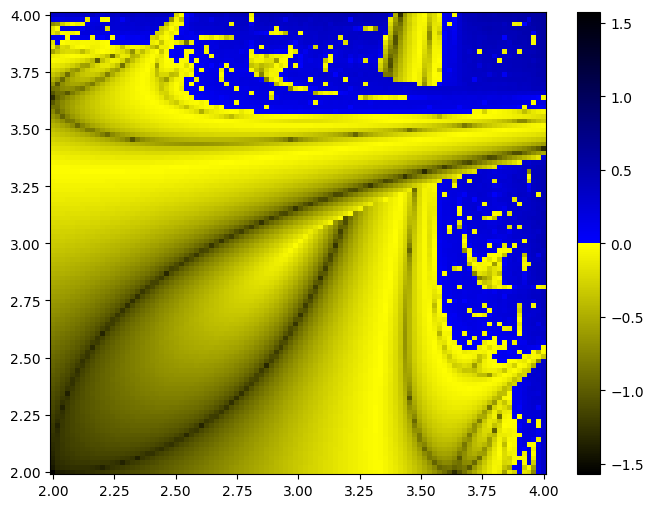

In [10]:
# Depict proto-task fractal

plt.figure(figsize=(8, 6))
plt.pcolormesh(np.linspace(amin, amax, 100),
               np.linspace(bmin, bmax, 100),
               np.arctan(lbd), 
               cmap=marcus_cmap,                       
               vmin=-1.57, vmax=1.57,           # out of bounds of arctan
               shading='auto')
plt.colorbar();

### Colormesh (full task)

In [11]:
# Execute full-task (1000 * 1000 points)

start = time.time()
lbd = lambdas_for_grid(amin, amax, bmin, bmax, na_full, nb_full, x_init=0.51, maxit=1000, seq=np.array([0, 1]))
stop = time.time()

print(f"Full task took {(stop - start):.2f} seconds")

Full task took 2.87 seconds


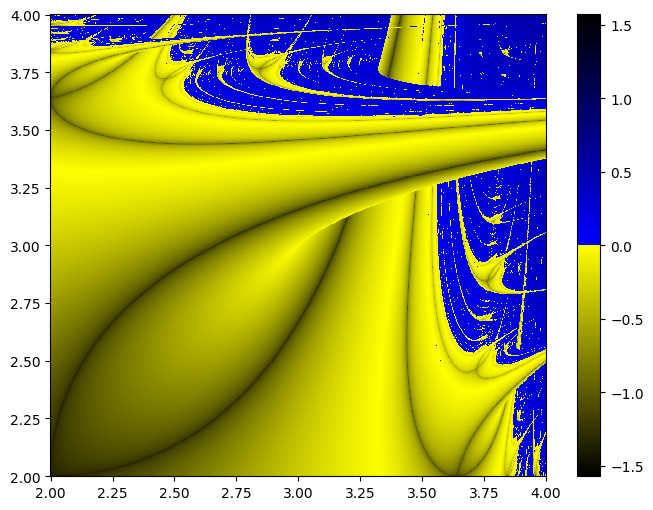

In [13]:
# Depict full-task fractal

plt.figure(figsize=(8, 6))
plt.pcolormesh(np.linspace(amin, amax, 1000),
               np.linspace(bmin, bmax, 1000),
               np.arctan(lbd), 
               cmap=marcus_cmap,                       
               vmin=-1.57, vmax=1.57,           # out of bounds of arctan
               shading='auto')
plt.colorbar();

###  Dynamic map

In [14]:
import holoviews as hv

from holoviews import opts
from holoviews.streams import RangeXY

In [15]:
imwidth, imheight = 600, 600                     # geometry parameters of the map
maxit = 200                                      # max number of lambda iterations

# Callback for recalculating fractal image
def get_fractal(x_range, y_range):
    
    a1, a0 = x_range
    b0, b1 = y_range
    
    arr = np.arctan(lambdas_for_grid(a0, a1, b0, b1, imheight, imwidth, x_init=0.51, seq=np.array([0, 1]), maxit=maxit))
    img = hv.Image(arr, bounds=(a0, b0, a1, b1))
    
    return img

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
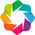

:DynamicMap   []
   :Image   [x,y]   (z)

In [16]:
hv.extension('bokeh')

# Flow associated with the X and Y axis ranges
range_stream = RangeXY(x_range=(amin, amax), y_range=(bmin, bmax))

# A dynamic map that calculates a fractal
dmap = hv.DynamicMap(get_fractal, streams=[range_stream])


dmap.opts(opts.Image(cmap=marcus_cmap, clim=(-1.57, 1.57), logz=False,
                     height=imheight, width=imwidth))